In [1]:
import os, sys
from pathlib import Path
import yaml
#import mintflow
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
import numpy as np
from pprint import pprint
import pickle
import anndata
import gc

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# import torch
from datetime import datetime
# import mintflow
# import mintflow.interface.perturbation.module_gen_micsizefactor
# import mintflow.interface.perturbation.module_gen_stdata

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: 

In [2]:
1

1

In [3]:
def func_isrunning_jupyterNB() -> bool:
    try:
        shell = get_ipython().__class__.__name__
        if shell == 'ZMQInteractiveShell':
            return True   # Jupyter notebook or qtconsole
        elif shell == 'TerminalInteractiveShell':
            return False  # Terminal running IPython
        else:
            return False  # Other type (?)
    except NameError:
        return False      # Probably standard Python interpreter

flag_isrunning_jupyterNB = func_isrunning_jupyterNB()
print("flag_isrunning_jupyterNB is set to {}".format(flag_isrunning_jupyterNB))

flag_isrunning_jupyterNB is set to True


In [4]:
# settings ===
path_results =  \
"/nfs/team361/aa36/OnGit/inflow-reproducibility/Analysis/35_DosageAnalysis_Melanoma/NonGit/OutputsJune11th/celltypereplace"
obskey_celltype = 'broad_celltypes'
num_iters_guidance = 10000
lr_optim = 0.0001
conf_interval_percelltype_prior = 0.95
batch_index_trainingdata = 7

num_DEGs_to_show = 20

"""
Interesting observation: when I reduced `conf_interval_percelltype_prior` form 0.99 to 0.5, the upreg terms started to come down.
"""


list_genes_KO = [
    'IL13'
]  # in-silico KO is global overl all cells

list_CTandGeneandLFC = [
]  # in-silico upreg is done for specific cell type (s)
'''
In this notebook:
- 7.0 leads to 1235.0, which is around the control gex maximum count.
'''

'\nIn this notebook:\n- 7.0 leads to 1235.0, which is around the control gex maximum count.\n'

In [5]:
str_pathoutput_prefix = datetime.now().strftime("%Y-%m-%d %H:%M:%S").replace(' ', '_').replace(':', '_').replace('-', '_')
str_pathoutput_prefix

'2026_04_19_19_49_25'

In [6]:
# path_dump = os.path.join(
#     './NonGit/',
#     'Outputs_GenePerrurbation',
#     __session__.split('/')[-1][0:-6],
#     'Generated_{}'.format(str_pathoutput_prefix)
# )

# os.makedirs(path_dump, exist_ok=True)

In [7]:
# path_dump

In [8]:
# adata_region_original = sc.read_h5ad(
#     os.path.join(
#         path_results,
#         'adata_selected_region_original.h5ad'
#     )
# )
# adata_region_original

In [9]:
# adata_region_modified = sc.read_h5ad(
#     os.path.join(
#         path_results,
#         'adata_selected_region_modified.h5ad'
#     )
# )
# adata_region_modified

In [10]:
# adata_region_original.uns = {}
# adata_region_modified.uns = {}

In [11]:
# sc.pl.spatial(
#     adata_region_original,
#     spot_size=5,
#     color=obskey_celltype
# )
# sc.pl.spatial(
#     adata_region_modified,
#     spot_size=5,
#     color=obskey_celltype
# )

In [12]:
# adata = adata_region_original.copy()
# # create the neighbourhood graph
# kwargs_neighbourhood_graph = {
#     'spatial_key': 'spatial',
#     'library_key': None,
#     'set_diag': False,
#     'delaunay': False,
#     'n_neighs': 5
# }
# adata.uns = {}
# sq.gr.spatial_neighbors(
#     adata=adata,
#     **kwargs_neighbourhood_graph
# )

In [13]:
# def check_is_float(x):
#     try:
#         _ = float(x)
#         return True
#     except:
#         return False

In [14]:
# # validate the perturbation fields `list_genes_KO` and `list_CTandGeneandLFC`
# for g in list_genes_KO:
#     assert (g in adata.var.index.tolist())

#     for ct_g_lfc in list_CTandGeneandLFC:
#         ct, g, lfc = ct_g_lfc
#         assert ct in adata.obs[obskey_celltype].tolist()
#         assert g in adata.var.index.tolist()
#         assert check_is_float(lfc)

# print("Assertions were passed!")

In [15]:
# import warnings
# warnings.filterwarnings('ignore')

# # create theperturbation dataframe
# df_gene_perturbation = pd.DataFrame()
# for _, g in enumerate(adata.var_names.tolist()):

#     # handle KO
#     if g in list_genes_KO:
#         col_g = np.array(['KO'] * adata.shape[0], dtype='U10')
#     else:
#         col_g = np.array(['DC'] * adata.shape[0], dtype='U10')  # don't care by default
        
#         # handle upreg
#         for ct_g_lfc in list_CTandGeneandLFC:
#             if ct_g_lfc[1] == g:
#                 ct, _, lfc = ct_g_lfc

#                 col_g[
#                     (adata.obs[obskey_celltype] == ct).tolist()
#                 ] = f'UP:{ lfc }'

#     df_gene_perturbation[g] = col_g.tolist()

# df_gene_perturbation



In [16]:
# list_genes_KO

In [17]:
# fname_mintflow_checkpoint = \
# '/nfs/team361/aa36/OnGit/inflow-reproducibility/Analysis/15_10Samples_BEACON/NonGit/RunOutputs/Feb12_20_00/Output_Path_Run3/CheckpointAndPredictions/inflow_model.pt'

In [18]:
# sys.modules['inflow'] = mintflow

In [19]:
PATH='/nfs/team361/aa36/OnGit/mintflow-benchmarking/AK_Private/15_GenePerturbation_4Lloyd/NonGit/Outputs_GenePerrurbation/nb2_gene_perturbation_March18th_UPreg_IL13/Generated_2026_03_18_17_16_47/'
adata=sc.read_h5ad(PATH+'adata_with_and_without_guidance.h5ad')
adata

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 18362 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_spatial_X', 'inflow_spatial_Y', 'inflow_spatial_activity', 'ID_NCC_strformat', 'ID_NCC', 'NCC_kmeans_index', 'inflow_TutorialNB_inside_polyg', 'gene guidance'
    obsm: 'MintFLow_Generated_S_in', 'MintFLow_Generate

In [20]:
"RPLP0" in adata.var_names

False

In [21]:
adata.obs["fine_celltypes"].value_counts()

fine_celltypes
Treg                   2458
Tnaive/Tcm             2242
KC2/3_cycling          1826
T                      1654
KCinflamm_basal/int    1534
cDC2                   1220
F1: Superficial         686
VE                      616
F3: FRC-like            608
MigDC                   558
Tc_IL13                 520
Pericyte1_CCL19+        460
KC_Sebocyte_basal       456
Mac2                    384
F2: Universal           346
KCinflamm_late          304
cDC1                    274
MoDC/cDC2               250
Tc                      228
Mac2_CCL14hi            220
LE                      192
Melanocyte              164
KC1-2                   162
T_Prolif                152
Mast cell               150
Nonspecific             106
KC3                      94
F2/3: Stroma_PPARG+      88
KC5                      80
KC4                      70
LC                       62
Schwann                  54
pDC                      48
F5: NGFR+                30
LC_SLC18A2+              24
F5: R

In [22]:
RENAME = {"gene guidance: False":  "Original",
            "gene guidance: True": "Perturbed"
}

adata.obs["gene guidance2"]=adata.obs["gene guidance"].map(RENAME)

In [23]:
adata_with_and_without_guidance=adata

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/software/cellgen/tea

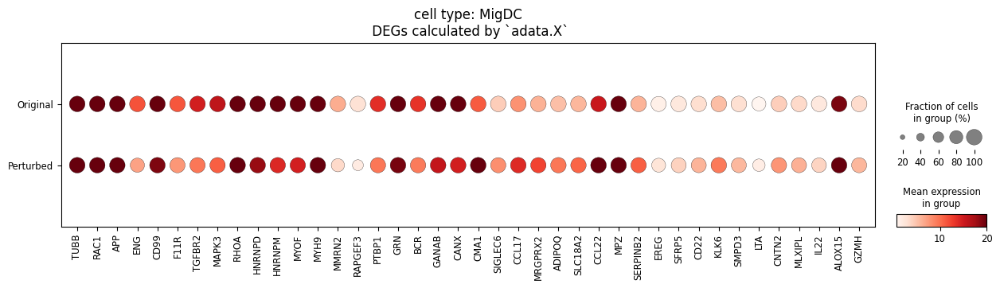

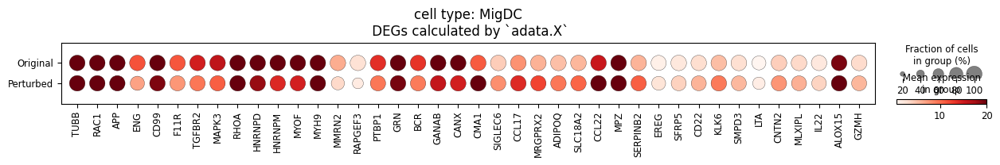

In [24]:
for ct in set(["MigDC"]):

    adata_DEG = adata_with_and_without_guidance[
        adata_with_and_without_guidance.obs[obskey_celltype] == ct
    ].copy()
    sc.pp.log1p(adata_DEG)

    sc.tl.rank_genes_groups(
        adata_DEG, 
        groupby='gene guidance', 
        use_raw=False,       # <--- This is the key argument
        method='wilcoxon'    # or 't-test'
    )

    list_DEGs = sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: False')['names'].tolist()[0:num_DEGs_to_show] + \
        sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: True')['names'].tolist()[0:num_DEGs_to_show]
    
    
    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,3],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    dp.savefig("figures/IL13_upreg_legend.pdf", dpi=300)
    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,1],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    dp.savefig("figures/IL13_upreg.pdf", dpi=300)
    #dp.show()

    # clean up
    del adata_DEG
    gc.collect(); gc.collect(); gc.collect()

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/software/cellgen/tea

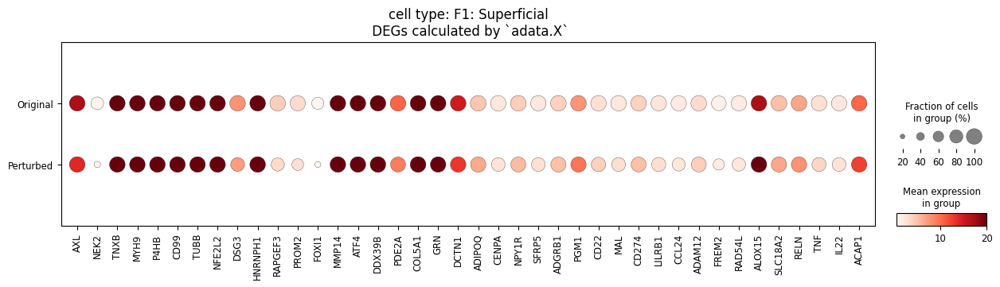

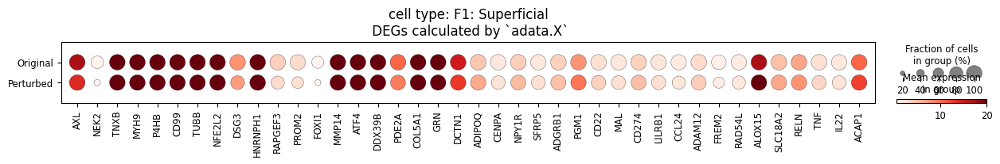

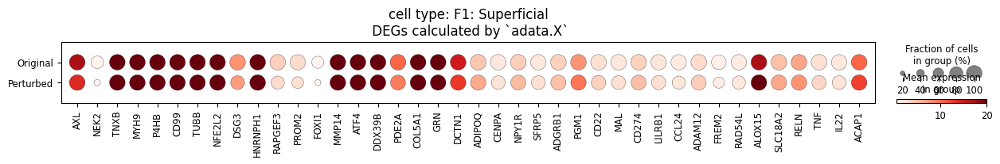

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/software/cellgen/tea

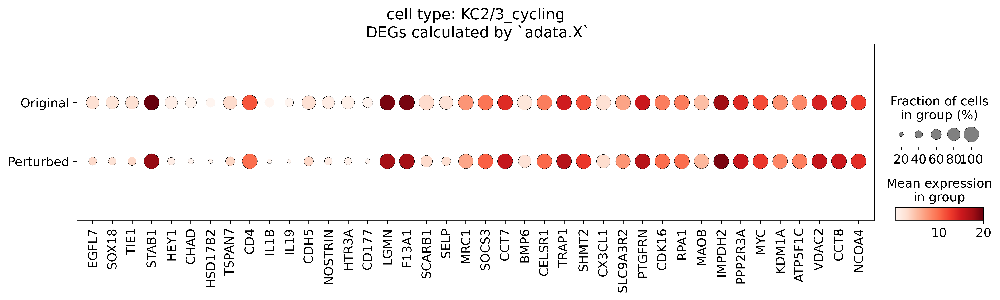

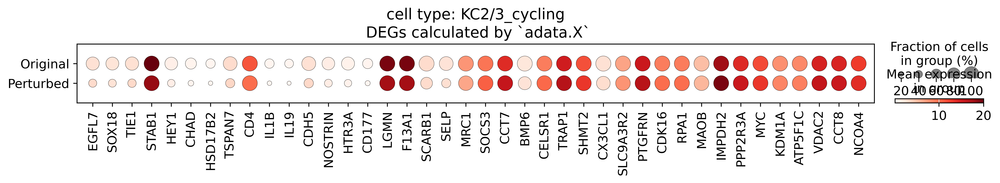

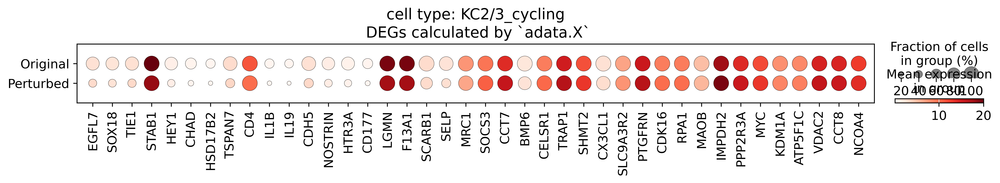

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/software/cellgen/tea

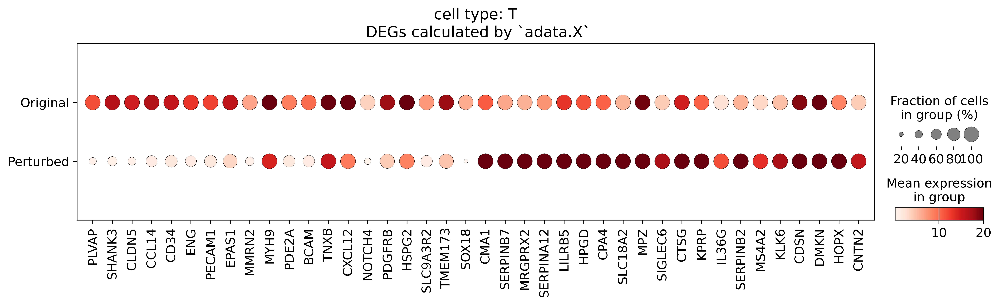

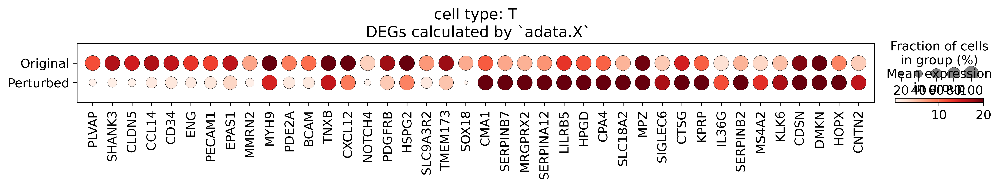

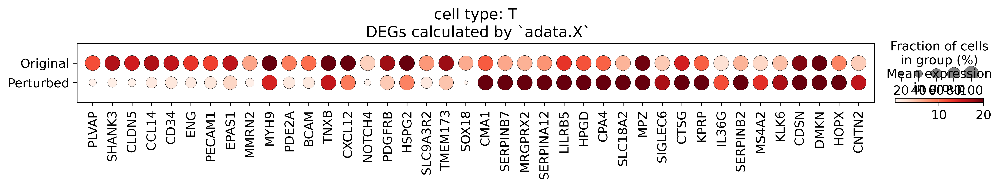

In [25]:
for ct in set(["KC2/3_cycling", "F1: Superficial", "T"]):

    adata_DEG = adata_with_and_without_guidance[
        adata_with_and_without_guidance.obs[obskey_celltype] == ct
    ].copy()
    sc.pp.log1p(adata_DEG)

    sc.tl.rank_genes_groups(
        adata_DEG, 
        groupby='gene guidance', 
        use_raw=False,       # <--- This is the key argument
        method='wilcoxon'    # or 't-test'
    )

    list_DEGs = sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: False')['names'].tolist()[0:num_DEGs_to_show] + \
        sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: True')['names'].tolist()[0:num_DEGs_to_show]
    
    
    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,3],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    ct_clean = ct.replace("/", "_")

    dp.savefig(f"figures/IL13_{ct_clean}_upreg_legend.pdf", dpi=300)
    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,1],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    dp.savefig(f"figures/IL13_{ct_clean}__upreg.pdf", dpi=300)
    dp.show()

#     sc.settings.set_figure_params(dpi_save=300, dpi=300, facecolor="white", frameon=False, figsize=(4,2))
#     genes = ["CCL17"]
#     vio = sc.pl.violin(
#         adata_with_and_without_guidance[
#             adata_with_and_without_guidance.obs[obskey_celltype] == ct
#         ],
#         var_names=genes,
#         groupby="gene guidance2",
        
#        # adata_ct, genes, groupby="original_vs_modified",
#        # layer="xspl_before_log1p", 
#         cmap="Reds",
#         show=True,
#       #  order=["original","modified"],
#     )
#     ct_clean = ct.replace("/", "_")
#     for ax in all_axes(vio): ax.grid(False)
#     plt.savefig(f"violin_perturbdepletionCCL17_{ct_clean}.pdf", dpi=300, bbox_inches="tight")

#     plt.show()
    sc.settings.set_figure_params(dpi_save=300, dpi=300, facecolor="white", frameon=False, figsize=(5,5))


    
    
    # clean up
    del adata_DEG
    gc.collect(); gc.collect(); gc.collect()

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same e

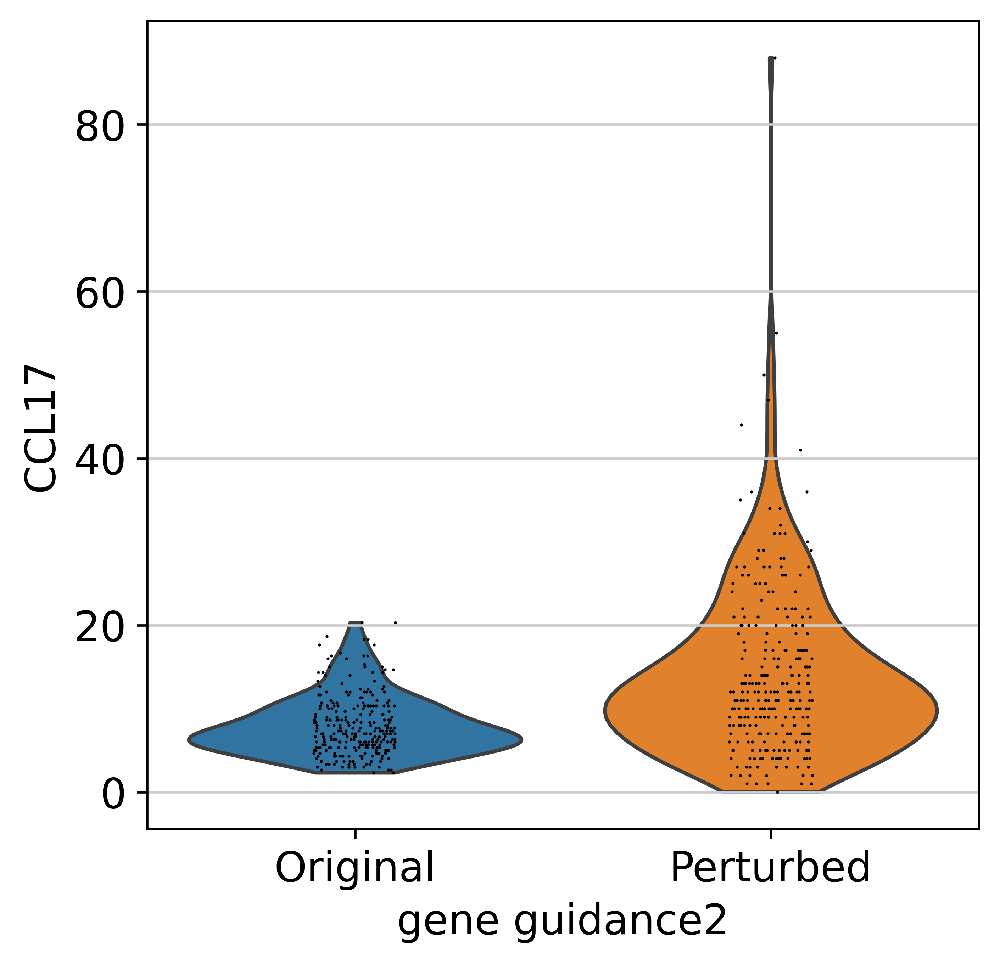

In [27]:
sc.pl.violin(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == "MigDC"
        ],
        "CCL17",
        groupby="gene guidance2",
        
       # adata_ct, genes, groupby="original_vs_modified",
       # layer="xspl_before_log1p", 
        cmap="Reds",
        show=True,
        save="CCL17_violin.pdf"
      #  order=["original","modified"],
    )

In [28]:
ct

'T'

In [29]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd

# # Subset
# ad_sub = adata_with_and_without_guidance[
#     adata_with_and_without_guidance.obs[obskey_celltype] == "MigDC"
# ]

# # Build long-format dataframe
# expr = sc.get.obs_df(ad_sub, keys=list(genes) + ["gene guidance2"])
# df_long = expr.melt(id_vars="gene guidance2", var_name="gene", value_name="expression")

# # Plot
# fig, axes = plt.subplots(1, len(genes), figsize=(3 * len(genes), 4), sharey=False)
# if len(genes) == 1:
#     axes = [axes]

# for ax, gene in zip(axes, genes):
#     sub = df_long[df_long["gene"] == gene]
#     sns.boxplot(data=sub, x="gene guidance2", y="expression",
#                 ax=ax, color="#D32F2F", fliersize=2)
#     ax.set_title(gene)
#     ax.set_xlabel("")
#     ax.spines[["top", "right"]].set_visible(False)

# plt.tight_layout()
# plt.show()

## 

# IL13 KO

In [30]:
PATH='/nfs/team361/aa36/OnGit/mintflow-benchmarking/AK_Private/15_GenePerturbation_4Lloyd//NonGit/Outputs_GenePerrurbation/nb2_gene_perturbation_March18th_KO_IL13/Generated_2026_03_18_13_35_27/'

adata=sc.read_h5ad(PATH+'adata_with_and_without_guidance.h5ad')
adata


/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 18362 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_spatial_X', 'inflow_spatial_Y', 'inflow_spatial_activity', 'ID_NCC_strformat', 'ID_NCC', 'NCC_kmeans_index', 'inflow_TutorialNB_inside_polyg', 'gene guidance'
    obsm: 'MintFLow_Generated_S_in', 'MintFLow_Generate

In [31]:
RENAME = {"gene guidance: False":  "Original",
            "gene guidance: True": "Perturbed"
}

adata.obs["gene guidance2"]=adata.obs["gene guidance"].map(RENAME)

In [32]:
adata_with_and_without_guidance=adata

/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/software/cellgen/tea

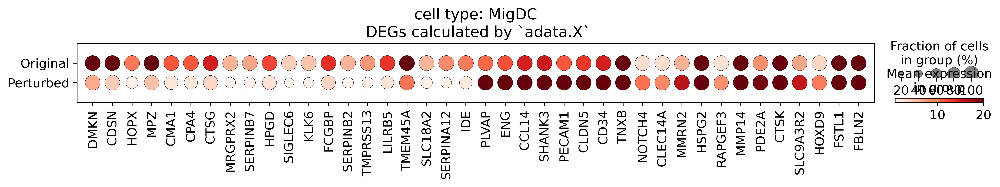

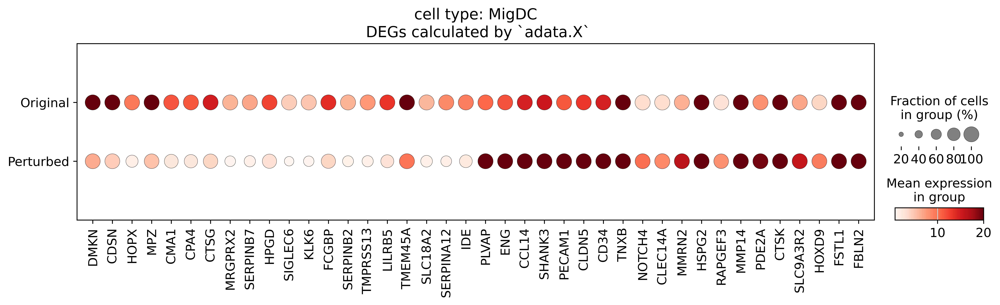

In [33]:
for ct in set(["MigDC"]):

    adata_DEG = adata_with_and_without_guidance[
        adata_with_and_without_guidance.obs[obskey_celltype] == ct
    ].copy()
    sc.pp.log1p(adata_DEG)

    sc.tl.rank_genes_groups(
        adata_DEG, 
        groupby='gene guidance', 
        use_raw=False,       # <--- This is the key argument
        method='wilcoxon'    # or 't-test'
    )

    list_DEGs = sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: False')['names'].tolist()[0:num_DEGs_to_show] + \
        sc.get.rank_genes_groups_df(adata_DEG, group='gene guidance: True')['names'].tolist()[0:num_DEGs_to_show]
    
    
    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,1],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    dp.savefig("figures/IL13_downreg_legend.pdf", dpi=300)
    #dp.show()

    dp = sc.pl.DotPlot(
        adata_with_and_without_guidance[
            adata_with_and_without_guidance.obs[obskey_celltype] == ct
        ],
        var_names=list_DEGs,
        groupby="gene guidance2",
        figsize=[15,3],
        cmap="Reds",
        vmax=20,
        title="cell type: {}\n DEGs calculated by `adata.X`".format(ct)
    )
    dp.savefig("figures/IL13_downreg.pdf", dpi=300)
    #dp.show()
    # clean up
#     genes = ["CCL17"]
#     vio = sc.pl.violin(
#         adata_with_and_without_guidance[
#             adata_with_and_without_guidance.obs[obskey_celltype] == ct
#         ],
#         var_names=genes,
#         groupby="gene guidance2",
        
#        # adata_ct, genes, groupby="original_vs_modified",
#        # layer="xspl_before_log1p", 
#         cmap="Reds",
#         show=True,
#       #  order=["original","modified"],
#     )
#     ct_clean = ct.replace("/", "_")
#     for ax in all_axes(vio): ax.grid(False)
#     plt.savefig(f"violin_perturbdepletionCCL17_{ct_clean}.pdf", dpi=300, bbox_inches="tight")

    del adata_DEG
    gc.collect(); gc.collect(); gc.collect()